## Importing Libraries

In [1]:
# Importing the necessary libraries.
import seaborn as sns

import pandas as pd
pd.options.display.max_rows = 10000

import numpy as np

import matplotlib.pyplot as plt
from time import sleep

## Install Selenium Python Package and Webdriver

In [4]:
!pip install selenium                

Chrome: https://sites.google.com/a/chromium.org/chromedriver/downloads  
Firefox: https://github.com/mozilla/geckodriver/releases  
Safari: https://webkit.org/blog/6900/webdriver-support-in-safari-10/  

In [2]:
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By


 ## Open a Webdriver

In [3]:
# Using the downloaded webdriver on the local desktop to open a webdriver.
from selenium import webdriver
from selenium.webdriver.common.keys import Keys

driver = webdriver.Chrome('Desktop\chromedriver.exe')
# driver.get("https://www.kijiji.ca")

C:\Users\Jay\AppData\Local\Temp\ipykernel_15472\2313738414.py:5: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome('Desktop\chromedriver.exe')


## Go to Page Indicated in the Get Method

In [4]:
# Passing in the interested webpage.
driver.get("https://www.thebay.com/c/women?srule=prod_rep_top_rated_ratings_en&categories%5BhierarchicalCategories.0%5D%5B0%5D=Women&categories%5BhierarchicalCategories.0%5D%5B1%5D=Jewellery%20%26%20Watches&categories%5BhierarchicalCategories.0%5D%5B2%5D=Watches&categories%5BhierarchicalCategories.0%5D%5B3%5D=Men%27s%20Watches&email=b777b3dd320d2e977bd3417dbc6bd7d43076a807428cf4f208e4802596052477&mi_ecmp=EMLHB30711&site_refer=EMLHB30711&mi_u=100000107747927")

In [5]:
# Get data from multiple pages by automatically clicking on "Load More".

for i in range(10):
    ### Located load button
    load_button = WebDriverWait(driver, 10).until(
    EC.presence_of_element_located((By.XPATH, '//*[@id="algolia-hits-placeholder"]/div/div/button'))
                                                )
    #Scroll down to reach load button
    driver.execute_script("arguments[0].scrollIntoView();", load_button)
    
    #Click on the load button
    load_button.click()
    
    sleep(5)
    
    

##  Page Source - Returns Information From the Page

In [6]:
# Information from the interested webpage is assigned to the variable Page_source.
page_source = driver.page_source

In [36]:
page_source

'<html lang="en" class="js-focus-visible"><head>\n<iframe src="javascript:void(0)" title="" role="presentation" style="width: 0px; height: 0px; border: 0px; display: none;"></iframe><style>.tfc-cfg-widget,.tfc-cfg-core {display: none}</style><link id="tfc-fitrec-css" type="text/css" rel="stylesheet" href="https://cdn.truefitcorp.com/store-tby/7.0.0-localized.6/resources/store/tby/css/fitrec-responsive.css"><script id="tfc-fitrec-library" type="text/javascript" async="" src="https://cdn.truefitcorp.com/consumer-ux/7.0-localized-202303011908.17/resources/fitrec/js/application.js"></script><script async="" src="https://tr2.smarterhq.io/app1/SmarterHandler.ashx?r=162451519&amp;i=ssveqalj5o-1&amp;modalc=638141717649534770^0186d2dd-50d9-4401-88a8-a311fea6ee12^0186d2dd-50d9-4521-96a5-eb4dba1b7fc6^0^72.137.0.235&amp;cb=_smtr.postprocess&amp;t=Women%20%7C%20The%20Bay%20Canada&amp;cid=women&amp;cn=women&amp;bv=2.7.14&amp;utc=300&amp;pt=3&amp;href=https%3A%2F%2Fwww.thebay.com%2Fc%2Fwomen%3Fsrule%

## Importing BeautifulSoup

In [7]:
from bs4 import BeautifulSoup

## Use BeautifulSoup to Parse the Html

In [9]:
# Processing page_source through BeautifulSoup library to parse the html.
soup = BeautifulSoup(page_source)

In [24]:
soup

<html class="js-focus-visible" lang="en"><head>
</head><body><iframe role="presentation" src="javascript:void(0)" style="width: 0px; height: 0px; border: 0px; display: none;" title=""></iframe><style>.tfc-cfg-widget,.tfc-cfg-core {display: none}</style><link href="https://cdn.truefitcorp.com/store-tby/7.0.0-localized.6/resources/store/tby/css/fitrec-responsive.css" id="tfc-fitrec-css" rel="stylesheet" type="text/css"/><script async="" src="https://s.pinimg.com/ct/lib/main.8b1025ba.js"></script><script async="true" crossorigin="anonymous" src="https://tr.snapchat.com/config/com/73148369-f805-49b8-acb5-a37f6ea62f1c.js"></script><script async="" data-id="C5DH5DNGE0M3SF4IECB0" src="https://analytics.tiktok.com/i18n/pixel/static/main.MTE3ZGZjMmFkMQ.js" type="text/javascript"></script><script async="" src="https://tr2.smarterhq.io/app1/SmarterHandler.ashx?r=346619993&amp;i=ssveqalj5o-1&amp;modalc=638141701980655407^0186d2c5-6831-461c-aecf-4d07542d9e3f^0186d2c5-6831-4141-8508-68010e2df79e^0^7

## Gathering Information of all the Mens Watches Based on div and class Info. 

In [10]:
# Details of each watch of the interested webpage is assigned to watch_list.
watch_list = soup.find_all('div',class_='hover-bg-content text-left')

In [11]:
# Creating a dictionary called mens_watch_dataset to organize all the data.
mens_watch_dataset = {
    'Brand':[],
    'Price':[],
    'Discounted Price':[],
    'Rating':[],
    'Gender':[]
}

# Looping over each of the watches from the watch_list to gather specific details
# such as brand name, price, discounted price, and ratings.
for w in watch_list:
    # Gathering brand names of the watches in the watch_list. 
    brand_name = w.find('h2',class_='product-brand adobelaunch__brand').get_text().strip()
    
    # Gathering watch prices of the watches in the watch_list.
    watch_price = w.find('div',class_='prod-price').get_text().strip()
    # Cleaning the raw data obtained to just get the watch prices of all the watches in the watch_list.
    watch_price = watch_price.replace("\n"," ")
    watch_price = watch_price.replace('$',' ')
    watch_price = watch_price.split(" ")
    
    # Getting the ratings of the watches in the watch_list and assigning 0 if no rating.
    if w.find('div', class_='TTteaser'):
        mens_watch_dataset['Rating'].append(w.find('div', class_='TTteaser')['data-starrating'])
    else:
        mens_watch_dataset['Rating'].append('0')
    
    # Appending all the gathered info into the respective empty lists created in mens_watch_dataset.
    mens_watch_dataset['Brand'].append(brand_name)
    mens_watch_dataset['Price'].append(watch_price[3])
    mens_watch_dataset['Discounted Price'].append(watch_price[1])
    mens_watch_dataset['Gender'].append('Male')


## Dataframe for Mens Watches

In [12]:
# Converting the mens_watch_dataset dictionary into a dataframe.
mens_watch=pd.DataFrame.from_dict(mens_watch_dataset)

In [19]:
mens_watch

,Brand,Price,Discounted Price,Rating,Gender
0,Axwell,293.00,190.45,5.0,Male
1,Seiko 5 Sports,450.00,315.00,5.0,Male
2,Fossil,279.00,237.15,5.0,Male
3,Fossil,229.00,194.65,5.0,Male
4,Shinola,785.00,785.00,5.0,Male
5,Fossil,249.00,211.65,5.0,Male
6,Casio,1075.00,752.50,5.0,Male
7,Fossil,199.00,169.15,5.0,Male
8,Citizen,495.00,346.50,5.0,Male
9,Bulova,995.00,696.50,5.0,Male


In [13]:
# Replace the empty strings with 0 for the Price column.
mens_watch['Price']=mens_watch['Price'].apply(lambda x:0 if x == '' else x)

In [14]:
# Convert the column Price's datatype from object to float.
mens_watch['Price']=mens_watch['Price'].astype('float')

In [15]:
# Replace the empty strings with 0 for the Discounted Price column.
mens_watch['Discounted Price']=mens_watch['Discounted Price'].apply(lambda x:0 if x == '' else x)

In [16]:
# Convert the column Discounted Price's datatype from object to float.
mens_watch['Discounted Price']=mens_watch['Discounted Price'].astype('float')

In [17]:
# Convert the column Rating's datatype from object to float.
mens_watch['Rating']=mens_watch['Rating'].astype('float')

In [18]:
# Convert the column Brand's datatype from object to float.
mens_watch['Brand']=mens_watch['Brand'].astype('string')

In [19]:
# Finding the datatypes of each column
mens_watch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 704 entries, 0 to 703
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Brand             704 non-null    string 
 1   Price             704 non-null    float64
 2   Discounted Price  704 non-null    float64
 3   Rating            704 non-null    float64
 4   Gender            704 non-null    object 
dtypes: float64(3), object(1), string(1)
memory usage: 27.6+ KB


 ## Open a Second Webdriver for Womens Watches

In [20]:
# Using the downloaded webdriver on the local desktop to open a webdriver.

from selenium import webdriver
from selenium.webdriver.common.keys import Keys

driver1 = webdriver.Chrome('Desktop\chromedriver.exe')

C:\Users\Jay\AppData\Local\Temp\ipykernel_15472\28495769.py:6: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver1 = webdriver.Chrome('Desktop\chromedriver.exe')


In [21]:
# Passing in the interested webpage for womens watch collections.
driver1.get("https://www.thebay.com/c/women?srule=prod_rep_top_rated_ratings_en&categories%5BhierarchicalCategories.0%5D%5B0%5D=Women&categories%5BhierarchicalCategories.0%5D%5B1%5D=Jewellery%20%26%20Watches&categories%5BhierarchicalCategories.0%5D%5B2%5D=Watches&categories%5BhierarchicalCategories.0%5D%5B3%5D=Women%27s%20Watches&email=b777b3dd320d2e977bd3417dbc6bd7d43076a807428cf4f208e4802596052477&mi_ecmp=EMLHB30711&site_refer=EMLHB30711&mi_u=100000107747927")

In [22]:
# Get data from multiple pages by automatically clicking on "Load More".
for i in range(10):
    # Located load button
    load_button = WebDriverWait(driver1, 10).until(
    EC.presence_of_element_located((By.XPATH, '//*[@id="algolia-hits-placeholder"]/div/div/button'))
                                                )
    # Scroll down to reach load button
    driver1.execute_script("arguments[0].scrollIntoView();", load_button)
    
    # Click on the load button
    load_button.click()
    
    sleep(5)

In [23]:
# Information from the interested women's watch collection webpage is assigned to the variable Page_source1.
page_source1 = driver1.page_source

In [24]:
# Processing page_source through BeautifulSoup library to parse the html.
soup1 = BeautifulSoup(page_source1)

## Gathering Information of all the Womens Watches Based on div and class Info

In [25]:
# Details of each watch of the interested webpage is assigned to womens_watch_list.
womens_watch_list = soup1.find_all('div',class_='hover-bg-content text-left')
womens_watch_list

[<div class="hover-bg-content text-left">
 <div class="color-swatches">
 <div class="swatches" data-variants='[{"colorRefinement":"Silver","color":"SILVER","size":"34_mm","sizeRefinement_bucket":"One Size","finalPrice":925,"originalPrice":925,"objectID":"93084043","ean":"","pipText":"","available":true}]'>
 <div class="d-none d-lg-block">
 </div>
 <div class="d-block d-lg-none mobile-disp-swatch color-exist">
 </div>
 </div>
 </div>
 <h2 class="product-brand adobelaunch__brand">Shinola</h2>
 <div class="pdp-link">
 <h3><a href="/product/show?pid=93084043&amp;queryID=55fc366ce304955d9a60eb6c7e10756b&amp;objectID=93084043">
                     The Bixby Three-Hand Stainless Steel Case &amp; Leather Strap Watch S0120250994
                     </a></h3>
 </div>
 <div class="prod-price">
 <span>
 <span class="sales finalPrice d-none"><span class="value"><span class="priceNumber"></span></span></span>
 <span class="strike-through list d-none"><span class="value"><span class="priceNumber">$

In [26]:
# Creating a dictionary called womens_watch_dataset to organize all the data.
womens_watch_dataset = {
    'Brand':[],
    'Price':[],
    'Discounted Price':[],
    'Rating':[],
    'Gender':[]
}
# Looping over each of the watches from the watch_list to gather specific details
# such as brand name, price, discounted price, and ratings.
for x in womens_watch_list:
    # Gathering brand names of womens watches in the womens_watch_list.
    brand_name1 = x.find('h2',class_='product-brand adobelaunch__brand').get_text()
    
    # Gathering watch prices of all the womens watches in the womens_watch_list.
    watch_price1 = x.find('div',class_='prod-price').get_text().strip()
    
    # Cleaning the raw data obtained to just get the watch prices of all the watches in the womens_watch_list.
    watch_price1 = watch_price1.replace("\n"," ")
    watch_price1=watch_price1.replace('$',' ')
    watch_price1=watch_price1.split(" ")
    
    # Getting the ratings of the watches in the watch_list and assigning 0 if no rating.
    if x.find('div', class_='TTteaser'):
        womens_watch_dataset['Rating'].append(x.find('div', class_='TTteaser')['data-starrating'])
    else:
        womens_watch_dataset['Rating'].append('0')
    
   # Appending all the gathered info into the respective empty lists created in mens_watch_dataset.
    womens_watch_dataset['Brand'].append(brand_name1)
    womens_watch_dataset['Price'].append(watch_price1[3])
    womens_watch_dataset['Discounted Price'].append(watch_price1[1])
    womens_watch_dataset['Gender'].append('Female')


## Dataframe for Womens Watches

In [27]:
# Converting the womens_watch_dataset dictionary into a dataframe.
womens_watch=pd.DataFrame.from_dict(womens_watch_dataset)
womens_watch

,Brand,Price,Discounted Price,Rating,Gender
0,Shinola,925,925,5,Female
1,Fossil,209,209,5,Female
2,Fossil,139,139,5,Female
3,Fossil,249,249,5,Female
4,Fossil,249,249,5,Female
5,Fossil,199,199,5,Female
6,Citizen,395,395,5,Female
7,Citizen,425,425,5,Female
8,Citizen,325,325,5,Female
9,COACH,350,350,5,Female


In [28]:
# Replace the empty strings with 0 for the Price column.
womens_watch['Price']=womens_watch['Price'].apply(lambda x:0 if x == '' else x)


In [29]:
# Convert the column Price's datatype from object to float.
womens_watch['Price']=womens_watch['Price'].astype('float')


In [30]:
# Replace the empty strings with 0 for the Discounted Price column.
womens_watch['Discounted Price']=womens_watch['Discounted Price'].apply(lambda x:0 if x == '' else x)


In [31]:
# Convert the column Discounted Price's datatype from object to float.
womens_watch['Discounted Price']=womens_watch['Discounted Price'].astype('float')


In [32]:
# Convert the column Rating's datatype from object to float.
womens_watch['Rating']=womens_watch['Rating'].astype('float')


In [33]:
# Convert the column Brand's datatype from object to float.
womens_watch['Brand']=womens_watch['Brand'].astype('string')


In [34]:
# Finding the datatypes of each column
womens_watch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 704 entries, 0 to 703
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Brand             704 non-null    string 
 1   Price             704 non-null    float64
 2   Discounted Price  704 non-null    float64
 3   Rating            704 non-null    float64
 4   Gender            704 non-null    object 
dtypes: float64(3), object(1), string(1)
memory usage: 27.6+ KB


## Dataframe of Both Men and Women

In [35]:
# Concating two datasets
data = [mens_watch,womens_watch]
watch = pd.concat(data)

# Creating a dataframe that consists of both men and womens watches 
mens_and_womens_watch=pd.DataFrame.from_dict(watch)
mens_and_womens_watch=mens_and_womens_watch.reset_index(drop='true')
mens_and_womens_watch

,Brand,Price,Discounted Price,Rating,Gender
0,Axwell,293.00,162.78,5.0,Male
1,Seiko 5 Sports,450.00,450.00,5.0,Male
2,Fossil,279.00,279.00,5.0,Male
3,Fossil,229.00,229.00,5.0,Male
4,Fossil,209.00,209.00,5.0,Male
5,Shinola,785.00,785.00,5.0,Male
6,Fossil,249.00,249.00,5.0,Male
7,Casio,1075.00,1075.00,5.0,Male
8,Fossil,199.00,199.00,5.0,Male
9,Citizen,495.00,495.00,5.0,Male


## Dataframe for Both Mens and Womens Collections with Discount Percentages

In [36]:
# Creating a new column in the dataframe mens_and_womens_watch to calculate the discount percentage.
mens_and_womens_watch['Discount Percentage'] = ((mens_and_womens_watch['Price']-mens_and_womens_watch['Discounted Price'])/(mens_and_womens_watch['Price']))*100

In [37]:
# Change the Price values to Discounted Price if the Price values are 0.
mens_and_womens_watch['Price'] = mens_and_womens_watch.apply(lambda x:x['Discounted Price'] if x['Price']==0 else x['Price'],axis=1)



In [38]:
# Tests to check if the dataframe mens_and_womens_watch contains infinity.

mens_and_womens_watch = mens_and_womens_watch[~np.isinf(mens_and_womens_watch['Discounted Price'])]


<AxesSubplot:title={'center':'Top 10 Brands Based on Average Discount Percentage'}, xlabel='Brand'>

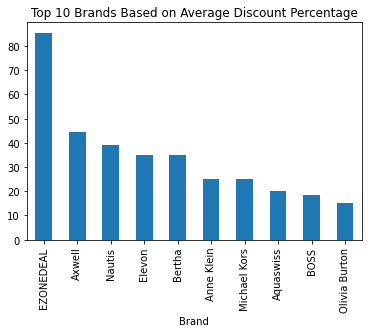

In [40]:
# Plotting a bar graph for the top 10 Brands based on average discount percentage for both male and female.
mens_and_womens_watch.groupby('Brand')['Discount Percentage'].mean().sort_values(ascending=False)[:10].plot(kind='bar', title='Top 10 Brands Based on Average Discount Percentage')

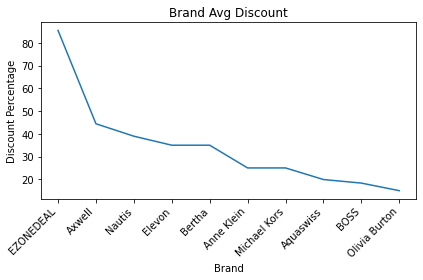

In [70]:
# Plotting a line graph for the top 10 Brands based on average discount percentage for both male and female.
brand_mean = mens_and_womens_watch.groupby('Brand')['Discount Percentage'].mean()\
.sort_values(ascending=False)[:10].reset_index()


sns.lineplot(data=brand_mean ,x = 'Brand',y='Discount Percentage')
plt.title('Brand Avg Discount')
plt.xticks(rotation=45,ha='right')
plt.tight_layout()

## Dataframe for Brands and collections

In [60]:
# Creating a dataframe for plotting graphs based on brands and stocks.
mens_and_womens_watch['Brand'].value_counts()
stocks = mens_and_womens_watch['Brand'].value_counts()
stocks_based_on_each_brand = pd.DataFrame({'Brand':stocks.index, 'Stock':stocks.values })

stocks_based_on_each_brand

,Brand,Stock
0,Bandini,214
1,Citizen,136
2,Bulova,94
3,Fossil,74
4,Daniel Klein,57
5,Aspen,53
6,GUESS,48
7,Michael Kors,44
8,Casio,40
9,COACH,30


## Top 10 Brands Stocks Wise for Both Male and Female

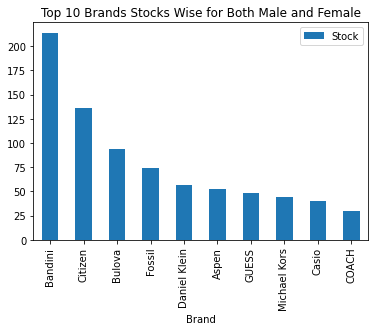

In [61]:
# Plotting graphs based on brands and stocks for both male and female.
stocks_based_on_each_brand=pd.DataFrame({'Brand':stocks.index, 'Stock':stocks.values })
stocks_based_on_each_brand
stocks_based_on_each_brand[:10].plot(x='Brand',y='Stock',kind='bar',title='Top 10 Brands Stocks Wise for Both Male and Female')
plt.show()

## Top 10 Brands Stocks Wise for Mens

<AxesSubplot:title={'center':'Top 10 Brands Stocks Wise for Mens'}>

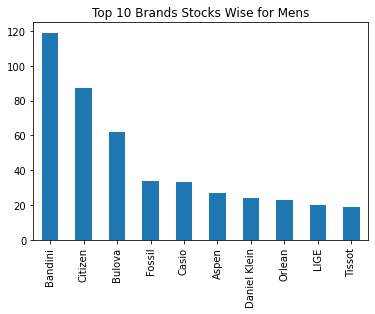

In [65]:
# Plotting graphs based on brands and stocks for both male.
mens_top_10=mens_and_womens_watch[mens_and_womens_watch['Gender']=='Male']['Brand'].value_counts()
mens_top_10=mens_top_10[:10]
mens_top_10.plot(x='Brand',y='Stock',kind='bar',title='Top 10 Brands Stocks Wise for Mens')

## Top 10 Brands Stocks Wise for Female

<AxesSubplot:title={'center':'Top 10 Brands Stocks Wise for Female'}>

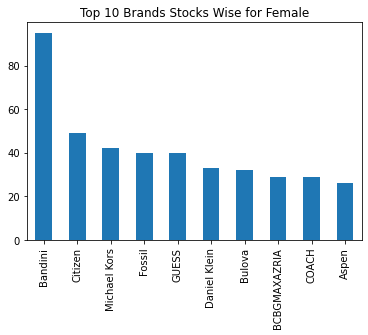

In [66]:
# Plotting graphs based on brands and stocks for both female.
womens_top_10=mens_and_womens_watch[mens_and_womens_watch['Gender']=='Female']['Brand'].value_counts()
womens_top_10=womens_top_10[:10]
womens_top_10.plot(x='Brand',y='Stock',kind='bar',title='Top 10 Brands Stocks Wise for Female')


## Top 20 Brands Based on Average Ratings

<AxesSubplot:title={'center':'Top 20 Rated Brands'}, xlabel='Brand'>

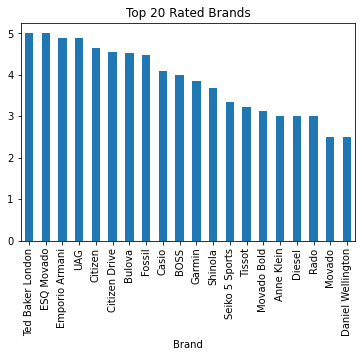

In [42]:
# Plotting graphs based on brands and Average Ratings for both male and female.
total_collections_in_brand_order=mens_and_womens_watch.sort_values(by=['Brand'])
top_30_rated_brands=total_collections_in_brand_order.groupby('Brand')['Rating'].mean().sort_values(ascending= False).round(2)
top_30_rated_brands[:20].plot(x='Brand',y='Rating',kind='bar',title='Top 20 Rated Brands')

## Top 10 Costly Brands

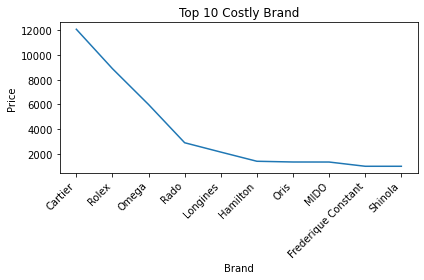

In [73]:
# Plotting top 10 costly brands based on brands and prices for both male and female.
top_10_costly_brands=mens_and_womens_watch.sort_values(by=['Brand']).groupby('Brand')['Price'].mean().round(2).sort_values(ascending=False)
top_10_costly_brands=pd.DataFrame({'Brand':top_10_costly_brands.index, 'Price':top_10_costly_brands.values })
top_10_costly_brands=top_10_costly_brands[:10]

sns.lineplot(data=top_10_costly_brands ,x = 'Brand',y='Price')
plt.title('Top 10 Costly Brand')
plt.xticks(rotation=45,ha='right')
plt.tight_layout()

## Gathering the Stocks for Each Colour for Both Mens and Womens Collections

In [84]:
# Creating a dictionary with empty lists named Colour and Stock.
num_of_items_in_each_colour = {'Colour':[],'Stock':[]}

# Looping over all the colours to gather various colours using the span and class.
for c in soup1.find_all('span',class_='color-refinement-text'):
    # Appending the colours to the empty list created.
    num_of_items_in_each_colour['Colour'].append(c.get_text())

# Looping over all the stock values to gather numbers using the span and class.
for c in soup1.find_all('span',class_='color-refinement-text-count'):
    # Appending the stock values to the empty list created.
    num_of_items_in_each_colour['Stock'].append((c.get_text()).replace('(','').replace(')',''))
    print(type(c.get_text()))

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


In [85]:
# Creating a datafrome for colurs and stocks
df_of_colour_and_stocks=pd.DataFrame.from_dict(num_of_items_in_each_colour)

In [86]:
# Gather the datatypes of the columns in the df_of_colour_and_stocks dataframe.
df_of_colour_and_stocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Colour  8 non-null      object
 1   Stock   8 non-null      object
dtypes: object(2)
memory usage: 256.0+ bytes


In [87]:
# Convert the column Discounted Price's datatype from object to float.
df_of_colour_and_stocks['Stock']=df_of_colour_and_stocks['Stock'].astype('int')


## Dataframe for Colour and Stocks

In [88]:
df_of_colour_and_stocks

,Colour,Stock
0,Gold,435
1,Silver,313
2,Black,183
3,Multi-Colour,143
4,Pink,107
5,Blue,95
6,Brown,81
7,White,81


## Pie Chart for Colour vs Stock

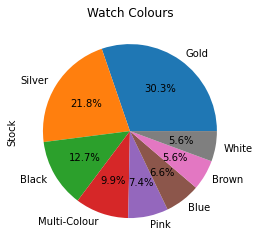

In [161]:
# Plotting a pie graph based on colours and stocks
df_of_colour_and_stocks.plot(kind='pie',y='Stock',labels=df_of_colour_and_stocks['Colour'],legend=False, autopct= '%1.1f%%')
plt.title('Watch Colours')
plt.show()